# Rig Case - Julia

# Table of Contents
1. [Downloading the data and preliminary analysis](#par1)
    1. [Stocks - returns](#par1)
2. [Creating portfolios](#par3)
3. [Simulation model](#par4)
    1. [Results](#par5)
4. [Sensitivity analysis](#par6)
   1. [Creating portfolio - periods comparision](#par7)
   2. [Results - periods comparision](#par8)

## Downloading the data and preliminary analysis <a name="par1"></a>

In [ ]:
include("complementary_functions.jl")
Random.seed!(100)

TaskLocalRNG()

In [ ]:
# creating the list of tickers for the chosen stocks
tickers = ["TSLA", "AMZN", "AAPL", "JPM", "MA", "MS", "ABT", "DHR", "JNJ", "SHEL", "XOM"]

# downloading the data
stocks = stocks_adjClose(tickers)

,TSLA,AMZN,AAPL,JPM,MA,MS,ABT,DHR,JNJ
,Float64,Float64,Float64,Float64,Float64,Float64,Float64,Float64,Float64
1,5.996,13.3815,13.734,39.5368,54.9058,19.9524,31.2382,46.2725,67.0908
2,5.83933,13.443,13.6326,40.0888,55.0479,19.9922,31.1638,46.1064,67.5329
3,5.816,13.148,13.685,40.55,54.2818,19.6579,31.1638,45.3264,67.4339
4,6.182,13.09,13.7095,40.3383,53.6248,19.2998,30.9655,45.0592,66.9807
5,6.472,13.087,13.8028,40.5727,53.7876,19.3794,31.1968,44.8497,66.6812
6,7.35533,13.3645,13.6877,41.2834,54.1905,19.6818,31.8578,45.2036,67.2879
7,6.97533,13.2765,13.7966,41.3363,53.9335,19.8808,31.1638,44.9291,65.7826
8,6.99667,13.3415,14.0022,42.0546,54.23,20.5493,31.1308,45.1386,66.0437
9,6.51733,13.46,13.9448,41.2758,53.6737,20.613,30.2963,44.6475,64.6535


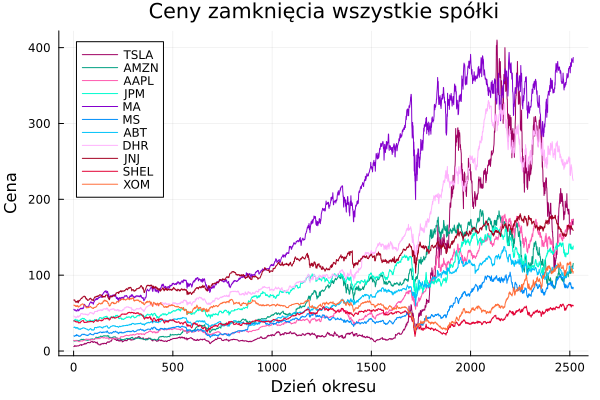

In [79]:

plot(Matrix(stocks),labels = permutedims(names(stocks)),legend=:topleft,
palette = ColorSchemes.mk_12,
ylabel = "Cena",
xlabel = "Dzień okresu",
title = "Ceny zamknięcia wszystkie spółki")

In [80]:
savefig("adjclose_wszystkie")

"c:\\Users\\shali\\Downloads\\adjclose_wszystkie.png"

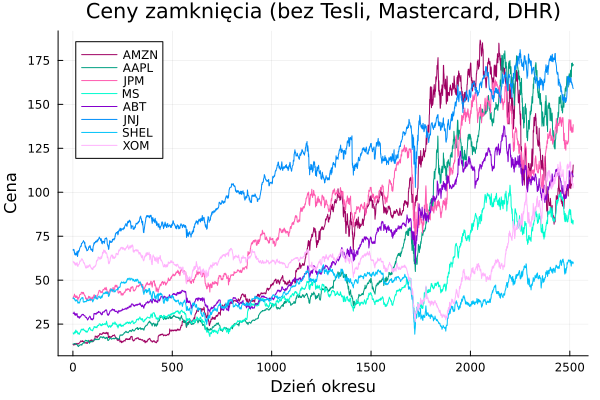

In [81]:
plot(Matrix(stocks[!, Not(1, 5, 8)]),labels = permutedims(names(stocks[!, Not(1, 5, 8)])),legend=:topleft,
palette = ColorSchemes.mk_12,
ylabel = "Cena",
xlabel = "Dzień okresu",

title = "Ceny zamknięcia (bez Tesli, Mastercard, DHR)")

In [82]:
savefig("adjclose_tansze")


"c:\\Users\\shali\\Downloads\\adjclose_tansze.png"

### 1.1. Stocks - returns <a name="par2"></a>

In [83]:
#macierz zwrotów względem pierwszego dnia
returns = mapcols(col -> col/col[1], stocks)

,TSLA,AMZN,AAPL,JPM,MA,MS,ABT,DHR
,Float64,Float64,Float64,Float64,Float64,Float64,Float64,Float64
1,1.0,1.0,1.0,1.0,1.0,1.0,1.0,1.0
2,0.973871,1.0046,0.992617,1.01396,1.00259,1.00199,0.99762,0.99641
3,0.96998,0.982551,0.996433,1.02563,0.988634,0.985241,0.99762,0.979553
4,1.03102,0.978216,0.998216,1.02027,0.976669,0.967292,0.991272,0.973779
5,1.07939,0.977992,1.00501,1.0262,0.979634,0.97128,0.998677,0.969252
6,1.22671,0.99873,0.996636,1.04418,0.986972,0.986438,1.01984,0.9769
7,1.16333,0.992153,1.00456,1.04552,0.982292,0.99641,0.99762,0.970969
8,1.16689,0.997011,1.01953,1.06368,0.987692,1.02992,0.996562,0.975495
9,1.08695,1.00587,1.01535,1.04399,0.97756,1.03311,0.969849,0.964882


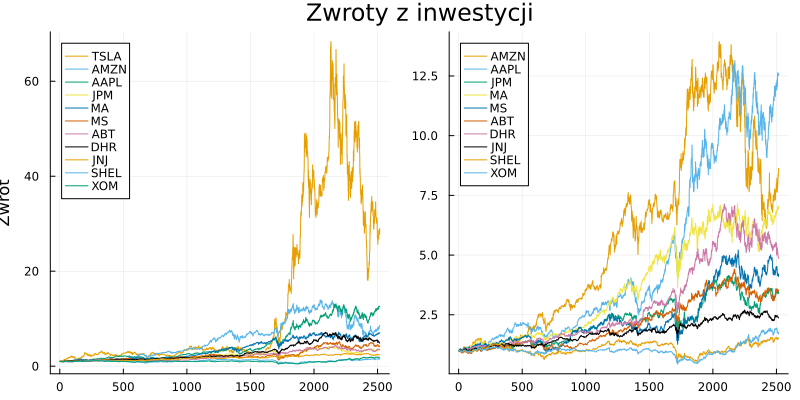

In [84]:
p1 = plot(Matrix(returns), labels = permutedims(names(returns)), legend=:topleft, palette = ColorSchemes.okabe_ito,
ylabel = "Zwrot")
p2 = plot(Matrix(returns[!,Not("TSLA")]), labels = permutedims(names(returns[!,Not("TSLA")])), legend=:topleft, palette = ColorSchemes.okabe_ito)
plot(p1,p2, layout = 2, size=(800,400), plot_title = "Zwroty z inwestycji")

In [85]:
savefig("zwroty")

"c:\\Users\\shali\\Downloads\\zwroty.png"

In [86]:
#policzenie stóp zwrotów dla analizowanych akcji
rates_of_return = log.(Matrix(stocks)) - log.(circshift(Matrix(stocks), (1,0)))
rates_of_return = DataFrame(rates_of_return,
names(returns))[2:end,:]

,TSLA,AMZN,AAPL,JPM,MA,MS
,Float64,Float64,Float64,Float64,Float64,Float64
1,-0.026476,0.00458537,-0.00741019,0.0138641,0.00258516,0.00199231
2,-0.00400384,-0.0221889,0.00383652,0.0114391,-0.0140159,-0.0168611
3,0.0610291,-0.00442108,0.00178832,-0.00523459,-0.0121768,-0.0183865
4,0.0458433,-0.000229209,0.00678464,0.00579389,0.00303172,0.0041153
5,0.12794,0.0209826,-0.00836933,0.017366,0.0074619,0.0154849
6,-0.0530456,-0.00660638,0.00792005,0.00128156,-0.00475311,0.0100586
7,0.00305382,0.00488392,0.0147907,0.0172276,0.00548234,0.0330741
8,-0.0709686,0.00884285,-0.00410528,-0.0186923,-0.0103107,0.00309347
9,-0.0543342,-0.00865548,0.00219883,-0.00183345,0.0098767,-0.0096996


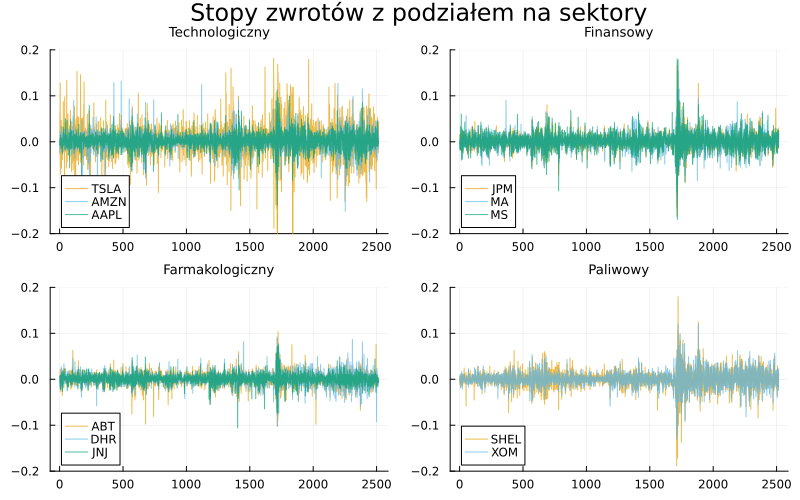

In [87]:
transpa = 0.7 # poziom transparentoności dla lepszej czytelności wykresów

p1 = plot(Matrix(rates_of_return[!,1:3]), labels = permutedims(names(rates_of_return)), 
    legend=:bottomleft, palette = ColorSchemes.okabe_ito, alpha = transpa, title = "Technologiczny")
p2 = plot(Matrix(rates_of_return[!,4:6]), labels = permutedims(names(rates_of_return[!,4:6])),
    legend=:bottomleft, palette = ColorSchemes.okabe_ito, alpha = transpa, title = "Finansowy")
p3 = plot(Matrix(rates_of_return[!,7:9]), labels = permutedims(names(rates_of_return[!,7:9])),
legend=:bottomleft, palette = ColorSchemes.okabe_ito, alpha = transpa, title = "Farmakologiczny")
p4 = plot(Matrix(rates_of_return[!,10:11]), labels = permutedims(names(rates_of_return[!,10:11])),
legend=:bottomleft, palette = ColorSchemes.okabe_ito, alpha = transpa, title = "Paliwowy")
plot(p1,p2, p3, p4, layout = 4, size=(800,500), plot_title = "Stopy zwrotów z podziałem na sektory", ylims = [-0.2, 0.2], titlefontsize = 9)

In [88]:
savefig("logzwroty")

"c:\\Users\\shali\\Downloads\\logzwroty.png"

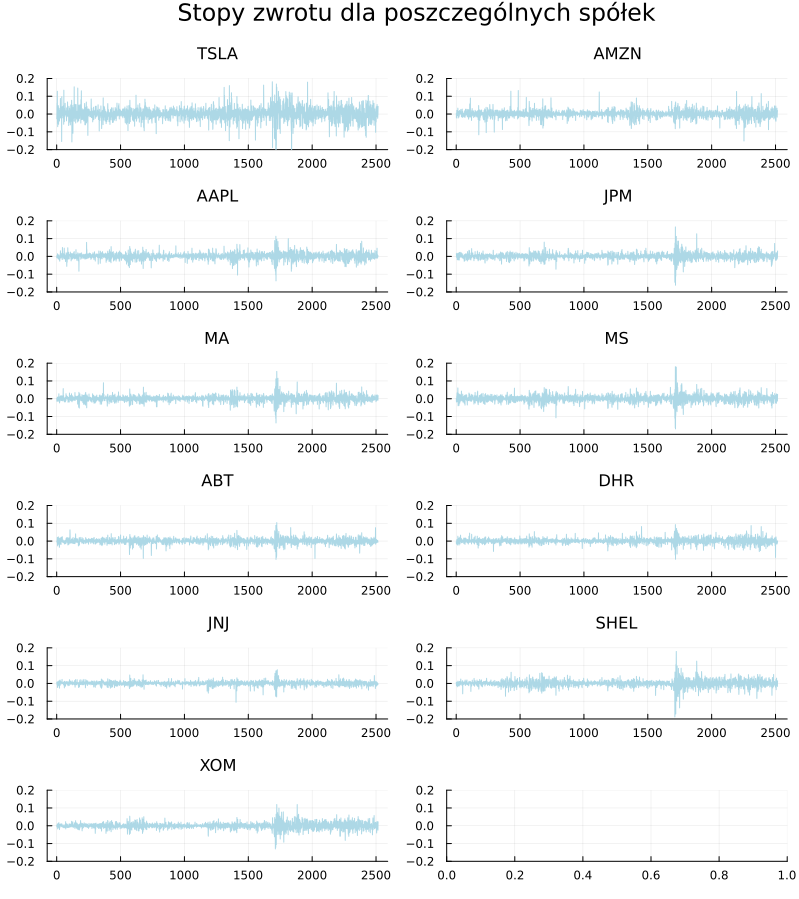

In [89]:
using StatsPlots
@df rates_of_return plot(cols(1:11); layout = (6, 2), ylims = [-0.2, 0.2], legend = false, title = permutedims(names(rates_of_return)),
size = (800, 900), titlefontsize = 11, c=:blues, plot_title = "Stopy zwrotu dla poszczególnych spółek")

In [90]:
savefig("stopy_spolki")

"c:\\Users\\shali\\Downloads\\stopy_spolki.png"

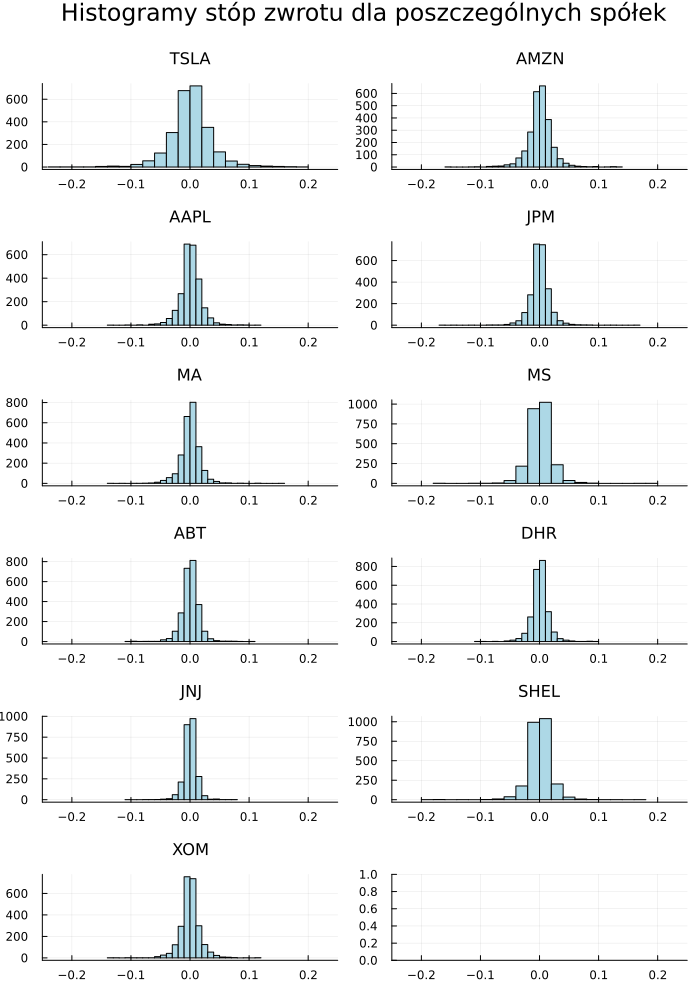

In [91]:
using StatsPlots
@df rates_of_return histogram(cols(1:11); layout = (6, 2), bins = 30, xlims = [-0.25, 0.25], legend = false, title = permutedims(names(rates_of_return)),
size = (700, 1000), titlefontsize = 11, c=:blues, plot_title = "Histogramy stóp zwrotu dla poszczególnych spółek")

In [92]:
savefig("histogramy_spolki")

"c:\\Users\\shali\\Downloads\\histogramy_spolki.png"

## Creating portfolios <a name="par3"></a>

In [93]:
#średnia stopa zwrotu i odchylenie standardowe dla każdej akcji
r_mean = Array(combine(rates_of_return, names(rates_of_return) .=> mean))
r_std = Array(combine(rates_of_return, names(rates_of_return) .=> std))

1×11 Matrix{Float64}:
 0.035707  0.0206865  0.0180208  0.0170311  …  0.0112689  0.019524  0.0171695

In [94]:
# ograniczenie wariancji pierwszego portfela:
var_max = 0.5*(maximum(r_std)^2)
# ograniczenie wariancji drugiego portfela:
var_max2 = 0.25*(maximum(r_std)^2)
# ograniczenie wariancji trzeciego portfela:
var_max3 = 0.8*(maximum(r_std)^2)

println("α_1 = ", sqrt(var_max)) #ograniczenie ryzyka w postaci odchylenia standardowego
println("Przewidywana wariancja pierwszego portfela ", sqrt(var_max * 252)) # wariancja dla całego roku
α₁ = sqrt(var_max)

println("α_2 = ", sqrt(var_max2)) 
println("Przewidywana wariancja drugiego portfela ", sqrt(var_max2 * 252)) 
α₂ = sqrt(var_max2)

println("α_3 = ", sqrt(var_max3))
println("Przewidywana wariancja trzeciego portfela ", sqrt(var_max3 * 252))
α₃ = sqrt(var_max3)

α_1 = 0.025248645593247073
Przewidywana wariancja pierwszego portfela 0.40080982308563184
α_2 = 0.017853488514760846
Przewidywana wariancja drugiego portfela 0.2834153438700307
α_3 = 0.03193729116361361
Przewidywana wariancja trzeciego portfela 0.5069887798078936


0.03193729116361361

In [95]:
covar = cov(Matrix(rates_of_return))
weights = ones(size(stocks)[2])/size(stocks)[2];

In [96]:
#zdefiniowanie funkcji wartości oczekiwanej portfela i wariancji portfela
portfolio_mean(weights; r_mean = r_mean) =  sum(weights .* r_mean')
portfolio_var(weights; covar = covar) = weights'*covar*weights

portfolio_var (generic function with 1 method)

In [97]:
#optymalizacja z ograniczeniem wariancji
using JuMP, Ipopt
function optymalizacja(rates_of_return=rates_of_return, var_max=var_max)
    portfolio = Model(Ipopt.Optimizer)
    set_silent(portfolio)
    @variable(portfolio, x[1:size(rates_of_return)[2]] >= 0)
    @objective(portfolio, Max, portfolio_mean(x))
    @constraint(portfolio, sum(x) == 1)
    @constraint(portfolio, portfolio_var(x) <= var_max);
    optimize!(portfolio)
    objective_value(portfolio)
    weights_opt = value.(x);
    return weights_opt
end

optymalizacja (generic function with 3 methods)

In [98]:
#funkcja do optymalizacji portfela z podaniem wyników
weights_opt = optymalizacja(rates_of_return, var_max)
function wynik_opt(weights_opt=weights_opt)
    println(weights_opt)
    println("Suma wag: ",sum(weights_opt))
    stopa_zw = (1 + portfolio_mean(weights_opt)) ^ 252 - 1
    println("Stopa zwrotu: ",stopa_zw)
    odch = sqrt(portfolio_var(weights_opt)*252)
    println("Odch. stand. portfela: ",odch)
    return(stopa_zw, odch)
end

wynik_opt (generic function with 2 methods)

In [99]:
weights_opt = optymalizacja(rates_of_return, var_max)
res_s = (1 + portfolio_mean(weights_opt)) ^ 252 - 1
res_o = sqrt(portfolio_var(weights_opt)*252)
println(wynik_opt(weights_opt))

weights_opt2 = optymalizacja(rates_of_return, var_max2)
res2_s = (1 + portfolio_mean(weights_opt2)) ^ 252 - 1
res2_o = sqrt(portfolio_var(weights_opt2)*252)
println(wynik_opt(weights_opt2))

weights_opt3 = optymalizacja(rates_of_return, var_max3)
res3_s = (1 + portfolio_mean(weights_opt3)) ^ 252 - 1
res3_o = sqrt(portfolio_var(weights_opt3)*252)
println(wynik_opt(weights_opt3))

[0.602126868276022, 3.002938325651636e-5, 0.39778222152710574, 6.403554719244646e-6, 1.8653759994782153e-5, 7.270305957866494e-6, 6.472791825161878e-6, 9.802835584915711e-6, 4.9898643412243015e-6, 3.4688699775746142e-6, 3.8188312149313e-6]
Suma wag: 1.0
Stopa zwrotu: 0.3549487854478046
Odch. stand. portfela: 0.400811333769554
(0.3549487854478046, 0.400811333769554)
[0.19316052186659025, 0.05281380326564478, 0.7033677934074908, 1.4778465268063988e-5, 0.050461974914088534, 1.3928451367416782e-5, 1.6810266500019735e-5, 0.00012442445159336973, 1.3766479932583797e-5, 5.559991076557968e-6, 6.638440447762099e-6]
Suma wag: 1.0
Stopa zwrotu: 0.3029789361664963
Odch. stand. portfela: 0.2834188874499662
(0.3029789361664963, 0.2834188874499662)
[0.8648541459972672, 3.464123078525307e-5, 0.13504593706129397, 6.7998054065858664e-6, 2.094966404699722e-5, 7.940244032358023e-6, 6.748902811870724e-6, 1.0282701367323832e-5, 5.0568918697505515e-6, 3.5709758454749506e-6, 3.926525273269341e-6]
Suma wag: 1.0

In [100]:
# Tabela przedstawiająca wyniki dla 3 różnych portfeli
data_table  = ["1" α₁ res_s res_o;"2" α₂ res2_s res2_o; "3" α₃ res3_s res3_o]

using PrettyTables
headers = (["Portfel inwestycyjny", "Poziom akceptowalnego ryzyka", "Odchylenie standardowe", "Stopa zwrotu"]);
pretty_table(data_table, backend = Val(:latex), header = headers, alignment = :c)

\begin{table}
  \begin{tabular}{cccc}
    \hline\hline
    \textbf{Portfel inwestycyjny} & \textbf{Poziom akceptowalnego ryzyka} & \textbf{Odchylenie standardowe} & \textbf{Stopa zwrotu} \\\hline
    1 & 0.0252486 & 0.354949 & 0.400811 \\
    2 & 0.0178535 & 0.302979 & 0.283419 \\
    3 & 0.0319373 & 0.385031 & 0.506991 \\\hline\hline
  \end{tabular}
\end{table}


In [101]:
# Tabela przedstawiająca skład poszczególnych portfeli
data_table2 = hcat(tickers, weights_opt, weights_opt2, weights_opt3)
headers = (["Spółka", "Portfel bazowy", "Portfel ostrożny", "Portfel ryzykowny"])
hl_spolki = LatexHighlighter((data_table2, i, j) -> (j==1), ["textbf"]);
pretty_table(data_table2, backend = Val(:latex), header = headers, alignment = :c, highlighters = hl_spolki)

\begin{table}
  \begin{tabular}{cccc}
    \hline\hline
    \textbf{Spółka} & \textbf{Portfel bazowy} & \textbf{Portfel ostrożny} & \textbf{Portfel ryzykowny} \\\hline
    \textbf{TSLA} & 0.602127 & 0.193161 & 0.864854 \\
    \textbf{AMZN} & 3.00294e-5 & 0.0528138 & 3.46412e-5 \\
    \textbf{AAPL} & 0.397782 & 0.703368 & 0.135046 \\
    \textbf{JPM} & 6.40355e-6 & 1.47785e-5 & 6.79981e-6 \\
    \textbf{MA} & 1.86538e-5 & 0.050462 & 2.09497e-5 \\
    \textbf{MS} & 7.27031e-6 & 1.39285e-5 & 7.94024e-6 \\
    \textbf{ABT} & 6.47279e-6 & 1.68103e-5 & 6.7489e-6 \\
    \textbf{DHR} & 9.80284e-6 & 0.000124424 & 1.02827e-5 \\
    \textbf{JNJ} & 4.98986e-6 & 1.37665e-5 & 5.05689e-6 \\
    \textbf{SHEL} & 3.46887e-6 & 5.55999e-6 & 3.57098e-6 \\
    \textbf{XOM} & 3.81883e-6 & 6.63844e-6 & 3.92653e-6 \\\hline\hline
  \end{tabular}
\end{table}


In [102]:
portfele = DataFrame(hcat(tickers, weights_opt, weights_opt2, weights_opt3), ["Spółka", "Portfel1", "Portfel2", "Portfel3"])

,Spółka,Portfel1,Portfel2,Portfel3
,Any,Any,Any,Any
1,TSLA,0.602127,0.193161,0.864854
2,AMZN,3.00294e-5,0.0528138,3.46412e-5
3,AAPL,0.397782,0.703368,0.135046
4,JPM,6.40355e-6,1.47785e-5,6.79981e-6
5,MA,1.86538e-5,0.050462,2.09497e-5
6,MS,7.27031e-6,1.39285e-5,7.94024e-6
7,ABT,6.47279e-6,1.68103e-5,6.7489e-6
8,DHR,9.80284e-6,0.000124424,1.02827e-5
9,JNJ,4.98986e-6,1.37665e-5,5.05689e-6


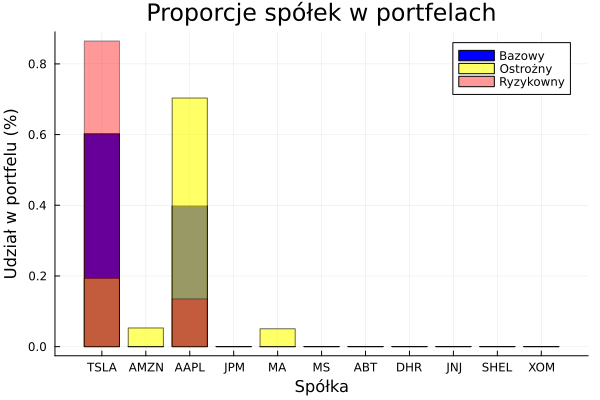

In [103]:

b1 = bar(tickers, weights_opt, color = "blue", label = "Bazowy")
b2 = bar!(tickers, weights_opt2, alpha = 0.6, color = "yellow", label = "Ostrożny")
b3 = bar!(tickers, weights_opt3, alpha = 0.4, color = "red", label = "Ryzykowny")
plot(b3, plot_title = "Proporcje spółek w portfelach", xlabel = "Spółka", ylabel = "Udział w portfelu (%)")


In [104]:
savefig("portfele")

"c:\\Users\\shali\\Downloads\\portfele.png"

## Simulation model <a name="par4"></a>


In [105]:
function decompose(data)
    data = Matrix(data)
    data_r = (log.(data) - log.(circshift(data, (1,0))))[2:end,:]
    mean(data_r), std(data_r), cholesky(cor(data_r)).L
end

decompose (generic function with 1 method)

In [106]:
function model(data, horizon, weights)
    mean_r, std_r, L  = decompose(data)
    
    # początkowa wartość udziału:
    P0 = collect(data[end,:]) 
    
    # generujemy zwroty zakładając wielowymiarowy rozkład normalny
    rates = Array{Float64}(undef, horizon, size(data)[2]) 
    for day in 1:horizon
        rates[day,:] = L *randn(size(data)[2])* std_r .+ mean_r
    end
    rates
    r_cum = exp.(transpose(sum(rates, dims = 1)))
    V = sum(weights .* P0 .* r_cum)
end

model (generic function with 1 method)

In [107]:
function run(iter, data, horizon, weights)
    V = []    
    for i in 1:iter
        push!(V, model(data, horizon, weights))
    end
    return V
end

run (generic function with 1 method)

### Results <a name="par5"></a>

In [108]:
initval = sum(collect(stocks[end,:]) .* weights_opt)
endval = run(10000, stocks, 252, weights_opt)
prc_rt = (endval .- initval)/initval*100

10000-element Vector{Float64}:
  25.038487496567864
  -7.3397296087786845
  -9.188861164953028
 -34.29392716829343
 -25.787421256910044
  12.247844553830706
  19.18720121270601
  13.632327538933996
   6.9215609374723455
  27.040650508607555
   ⋮
  10.850167416650768
 -15.823934864758732
  34.96728378091142
  66.74684428633513
  49.036093462798156
  29.25049845205599
 -19.012949136881765
  11.505598339608591
 -21.950200614996408

In [109]:
initval = sum(collect(stocks[end,:]) .* weights_opt2)
endval = run(10000, stocks, 252, weights_opt2)
prc_rt2 = (endval .- initval)/initval*100

10000-element Vector{Float64}:
  14.837498523068296
  -9.741927257172515
  29.76741791254393
 -13.193905681428092
  63.85350848355355
  -7.414873829375504
  -1.036724445551685
  56.47743541009883
  16.82863109591383
  79.83055015733773
   ⋮
  27.261338273854296
  -5.4770419106869745
  79.89757909589618
  45.813223095132614
  42.199702987084514
  97.89383833744218
  34.96795852389517
 -17.1474435451839
 -32.19577566293375

In [110]:
initval = sum(collect(stocks[end,:]) .* weights_opt3)
endval = run(10000, stocks, 252, weights_opt3)
prc_rt3 = (endval .- initval)/initval*100

10000-element Vector{Float64}:
  -2.4999769506030654
 -11.224011051198145
 -15.413701362724497
   6.933159591329422
 137.72981115524635
  -7.86221292031396
 130.45013648197786
 -27.248654019743118
  58.85007318786805
 -22.97554727099196
   ⋮
  31.61672925027152
  -1.5532601164273034
 -18.997199778520244
   4.217853551423115
  10.209039692567233
  24.588035666177248
  33.298583215647184
  22.00755898390196
  51.23332247461799

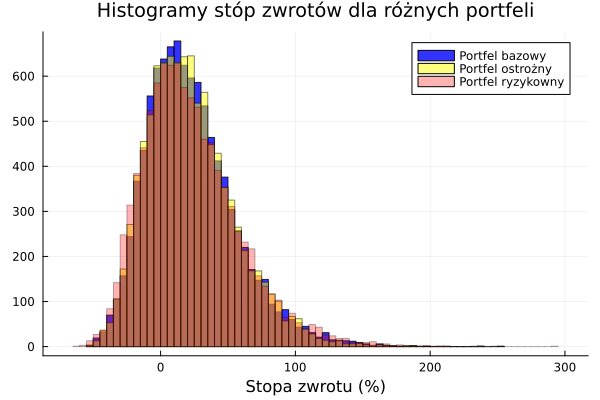

In [111]:
h1 = histogram(prc_rt, 
    label = "Portfel bazowy",
    alpha = 0.8,
    xlabel = "Stopa zwrotu (%)", 
    color="blue",
    bins = 100)

h2 = histogram!(prc_rt2, 
    labels = "Portfel ostrożny",
    alpha = 0.5,
    xlabel = "Stopa zwrotu (%)", 
    color="yellow",
    bins = 100)

h3 = histogram!(prc_rt3, 
    label = "Portfel ryzykowny",
    alpha = 0.3,
    xlabel = "Stopa zwrotu (%)", 
    color="red",
    bins = 100)
plot(h1, plot_title = "Histogramy stóp zwrotów dla różnych portfeli", titlefontsize = 13)

In [112]:
savefig("histogramy_por_portfeli")

"c:\\Users\\shali\\Downloads\\histogramy_por_portfeli.png"

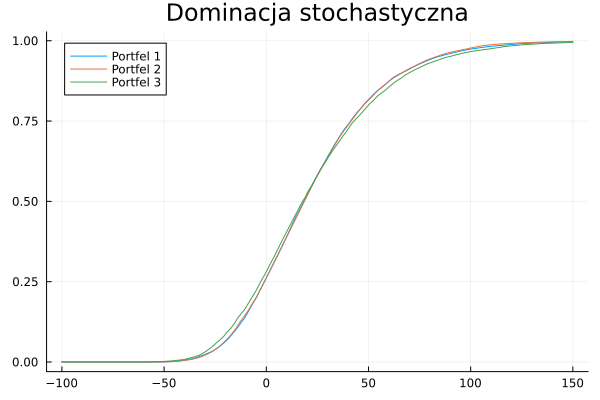

In [113]:
# Dominacja stochastyczna pierwszego rzędu
using Plots
cdf = ecdf(prc_rt)
cdf2 = ecdf(prc_rt2)
cdf3  = ecdf(prc_rt3)
plot(x -> cdf(x), -100, 150, label = "Portfel 1")
plot!(x -> cdf2(x), -100, 150, label = "Portfel 2")
plot!(x -> cdf3(x), -100, 150, label  = "Portfel 3", plot_title = "Dominacja stochastyczna")


In [114]:
savefig("stochastyczna_dom")

"c:\\Users\\shali\\Downloads\\stochastyczna_dom.png"

In [115]:
using Statistics
println("Portfel bazowy:")
println("VaR 1% = ", 1000*quantile!(prc_rt, 0.01))
println("VaR 10% = ", 1000*quantile!(prc_rt, 0.1))
println("Wartość oczekiwana: ", mean(prc_rt))
println("Zakres: ", extrema(prc_rt))
println()
println("Portfel ostrożny:")
println("VaR 1% = ", 1000*quantile!(prc_rt2, 0.01))
println("VaR 10% = ", 1000*quantile!(prc_rt2, 0.1))
println("Wartość oczekiwana: ", mean(prc_rt2))
println("Zakres: ", extrema(prc_rt2))
println()
println("Portfel ryzykowny:")
println("VaR 1% = ", 1000*quantile!(prc_rt3, 0.01))
println("VaR 10% = ", 1000*quantile!(prc_rt3, 0.1))
println("Wartość oczekiwana: ", mean(prc_rt3))
println("Zakres: ", extrema(prc_rt3))

Portfel bazowy:
VaR 1% = -36255.1158540546
VaR 10% = -14939.245779154297
Wartość oczekiwana: 22.779745257161952
Zakres: (-54.05225351447386, 251.12381282194923)

Portfel ostrożny:
VaR 1% = -35198.538101454025
VaR 10% = -15451.624518231969
Wartość oczekiwana: 22.62786086767223
Zakres: (-50.73547781248229, 239.78810989672616)

Portfel ryzykowny:
VaR 1% = -38715.53876614738
VaR 10% = -18113.953582822887


Wartość oczekiwana: 22.974506880103313
Zakres: (-60.83369720104875, 294.2736156831137)


## Sensitivity analysis  <a name="par6"></a>
Podział okresu historycznego uczącego parametry modelu na 2 równe okresy i ich analogiczna analiza

In [116]:
# pierwsza połowa danych 
stocks_1 = first(stocks,Int(round(nrow(stocks)/2)))

,TSLA,AMZN,AAPL,JPM,MA,MS,ABT,DHR,JNJ
,Float64,Float64,Float64,Float64,Float64,Float64,Float64,Float64,Float64
1,5.996,13.3815,13.734,39.5368,54.9058,19.9524,31.2382,46.2725,67.0908
2,5.83933,13.443,13.6326,40.0888,55.0479,19.9922,31.1638,46.1064,67.5329
3,5.816,13.148,13.685,40.55,54.2818,19.6579,31.1638,45.3264,67.4339
4,6.182,13.09,13.7095,40.3383,53.6248,19.2998,30.9655,45.0592,66.9807
5,6.472,13.087,13.8028,40.5727,53.7876,19.3794,31.1968,44.8497,66.6812
6,7.35533,13.3645,13.6877,41.2834,54.1905,19.6818,31.8578,45.2036,67.2879
7,6.97533,13.2765,13.7966,41.3363,53.9335,19.8808,31.1638,44.9291,65.7826
8,6.99667,13.3415,14.0022,42.0546,54.23,20.5493,31.1308,45.1386,66.0437
9,6.51733,13.46,13.9448,41.2758,53.6737,20.613,30.2963,44.6475,64.6535


In [117]:
# druga połowa danych 
stocks_2 = last(stocks,Int(round(nrow(stocks)/2)))

,TSLA,AMZN,AAPL,JPM,MA,MS,ABT,DHR,JNJ
,Float64,Float64,Float64,Float64,Float64,Float64,Float64,Float64,Float64
1,18.4547,78.7185,44.513,95.6632,185.279,46.6034,56.8424,99.0841,108.769
2,18.966,79.273,44.8283,96.5412,186.057,46.9837,57.2109,100.053,108.313
3,18.334,79.07,44.716,97.2815,186.466,47.4331,56.5477,99.2407,107.604
4,18.6047,80.093,45.0027,96.8339,187.799,46.975,56.9622,100.131,108.077
5,18.5233,80.1535,44.9526,95.7492,186.748,46.6725,57.5793,100.102,107.026
6,18.59,80.5075,45.0553,95.2586,186.028,45.8168,57.4504,99.9453,107.132
7,18.9173,80.6435,44.8928,91.1869,184.432,43.1807,56.4648,98.3991,105.307
8,19.448,81.2445,44.7973,93.27,186.602,44.0537,57.174,99.0841,106.691
9,18.982,81.481,44.6468,92.1165,185.006,43.3363,56.6766,97.1563,105.501


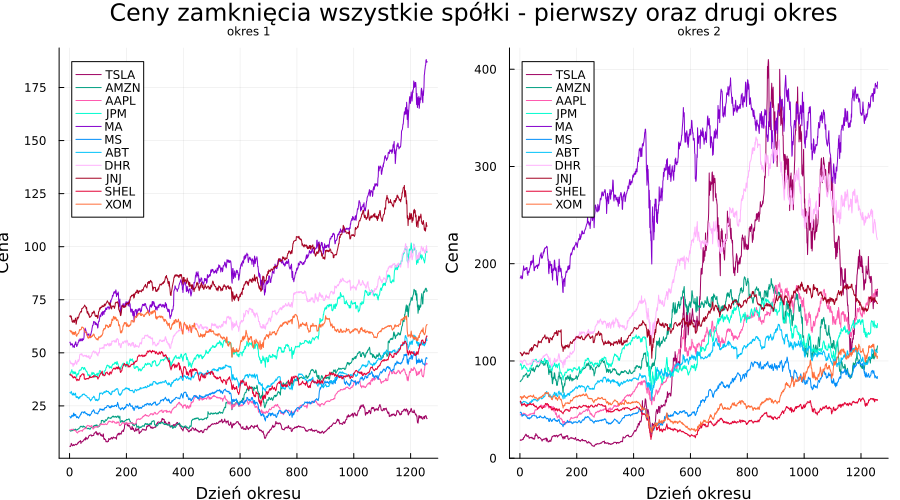

In [118]:
p1 = plot(Matrix(stocks_1),labels = permutedims(names(stocks_1)),legend=:topleft,
palette = ColorSchemes.mk_12,
ylabel = "Cena",
xlabel = "Dzień okresu",
title = "okres 1")


p2 = plot(Matrix(stocks_2),labels = permutedims(names(stocks_2)),legend=:topleft,
palette = ColorSchemes.mk_12,
ylabel = "Cena",
xlabel = "Dzień okresu",
title = "okres 2")
plot(p1,p2, layout = 2, size=(900,500), plot_title = "Ceny zamknięcia wszystkie spółki - pierwszy oraz drugi okres", titlefontsize = 8)

In [119]:
savefig("adjclose_wszystkie_por_okresy")

"c:\\Users\\shali\\Downloads\\adjclose_wszystkie_por_okresy.png"

In [120]:
returns_1 = mapcols(col -> col/col[1], stocks_1)
first(returns_1, 10)

,TSLA,AMZN,AAPL,JPM,MA,MS,ABT,DHR,JNJ
,Float64,Float64,Float64,Float64,Float64,Float64,Float64,Float64,Float64
1,1.0,1.0,1.0,1.0,1.0,1.0,1.0,1.0,1.0
2,0.973871,1.0046,0.992617,1.01396,1.00259,1.00199,0.99762,0.99641,1.00659
3,0.96998,0.982551,0.996433,1.02563,0.988634,0.985241,0.99762,0.979553,1.00511
4,1.03102,0.978216,0.998216,1.02027,0.976669,0.967292,0.991272,0.973779,0.998359
5,1.07939,0.977992,1.00501,1.0262,0.979634,0.97128,0.998677,0.969252,0.993894
6,1.22671,0.99873,0.996636,1.04418,0.986972,0.986438,1.01984,0.9769,1.00294
7,1.16333,0.992153,1.00456,1.04552,0.982292,0.99641,0.99762,0.970969,0.9805
8,1.16689,0.997011,1.01953,1.06368,0.987692,1.02992,0.996562,0.975495,0.984392
9,1.08695,1.00587,1.01535,1.04399,0.97756,1.03311,0.969849,0.964882,0.963672


In [121]:
returns_2 = mapcols(col -> col/col[1], stocks_2)
first(returns_2, 10)

,TSLA,AMZN,AAPL,JPM,MA,MS,ABT,DHR,JNJ
,Float64,Float64,Float64,Float64,Float64,Float64,Float64,Float64,Float64
1,1.0,1.0,1.0,1.0,1.0,1.0,1.0,1.0,1.0
2,1.02771,1.00704,1.00708,1.00918,1.0042,1.00816,1.00648,1.00978,0.995815
3,0.993461,1.00447,1.00456,1.01692,1.00641,1.0178,0.994815,1.00158,0.989295
4,1.00813,1.01746,1.011,1.01224,1.0136,1.00797,1.00211,1.01057,0.993641
5,1.00372,1.01823,1.00988,1.0009,1.00793,1.00148,1.01296,1.01027,0.983983
6,1.00733,1.02273,1.01218,0.995771,1.00404,0.983123,1.0107,1.00869,0.984956
7,1.02507,1.02445,1.00853,0.953208,0.995431,0.926558,0.993356,0.993086,0.968171
8,1.05383,1.03209,1.00639,0.974984,1.00714,0.945289,1.00583,1.0,0.980901
9,1.02857,1.03509,1.00301,0.962926,0.998529,0.929896,0.997083,0.980543,0.969954


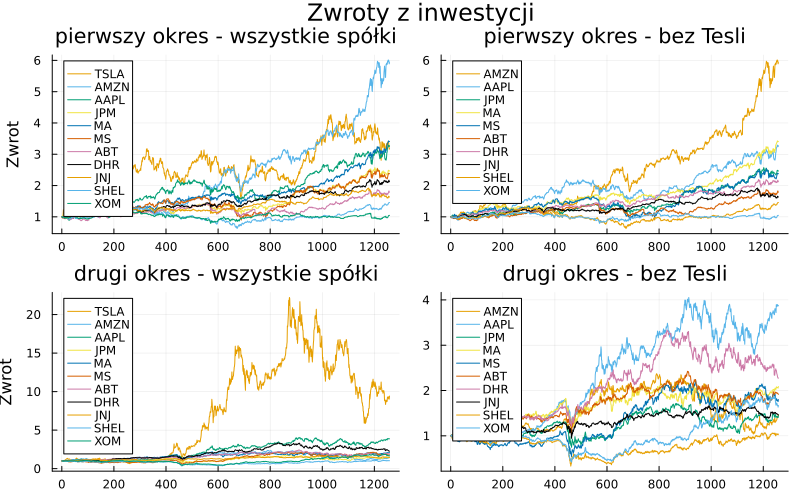

In [149]:
p1 = plot(Matrix(returns_1), labels = permutedims(names(returns_1)), legend=:topleft, palette = ColorSchemes.okabe_ito,
ylabel = "Zwrot", title = "pierwszy okres - wszystkie spółki")
p2 = plot(Matrix(returns_1[!,Not("TSLA")]), labels = permutedims(names(returns_1[!,Not("TSLA")])), legend=:topleft, palette = ColorSchemes.okabe_ito,
title = "pierwszy okres - bez Tesli")
p3 = plot(Matrix(returns_2), labels = permutedims(names(returns_2)), legend=:topleft, palette = ColorSchemes.okabe_ito,
ylabel = "Zwrot", title = "drugi okres - wszystkie spółki")
p4 = plot(Matrix(returns_2[!,Not("TSLA")]), labels = permutedims(names(returns_2[!,Not("TSLA")])), legend=:topleft, palette = ColorSchemes.okabe_ito,
title = "drugi okres - bez Tesli")


plot(p1,p2,p3,p4, layout = 4, size=(800,500), plot_title = "Zwroty z inwestycji")

In [123]:
savefig("zwroty_porownanie")

"c:\\Users\\shali\\Downloads\\zwroty_porownanie.png"

In [124]:
rates_of_return_1 = log.(Matrix(stocks_1)) - log.(circshift(Matrix(stocks_1), (1,0)))
rates_of_return_1 = DataFrame(rates_of_return_1,
names(returns_1))[2:end,:]

,TSLA,AMZN,AAPL,JPM,MA,MS
,Float64,Float64,Float64,Float64,Float64,Float64
1,-0.026476,0.00458537,-0.00741019,0.0138641,0.00258516,0.00199231
2,-0.00400384,-0.0221889,0.00383652,0.0114391,-0.0140159,-0.0168611
3,0.0610291,-0.00442108,0.00178832,-0.00523459,-0.0121768,-0.0183865
4,0.0458433,-0.000229209,0.00678464,0.00579389,0.00303172,0.0041153
5,0.12794,0.0209826,-0.00836933,0.017366,0.0074619,0.0154849
6,-0.0530456,-0.00660638,0.00792005,0.00128156,-0.00475311,0.0100586
7,0.00305382,0.00488392,0.0147907,0.0172276,0.00548234,0.0330741
8,-0.0709686,0.00884285,-0.00410528,-0.0186923,-0.0103107,0.00309347
9,-0.0543342,-0.00865548,0.00219883,-0.00183345,0.0098767,-0.0096996


In [125]:
rates_of_return_2 = log.(Matrix(stocks_2)) - log.(circshift(Matrix(stocks_2), (1,0)))
rates_of_return_2 = DataFrame(rates_of_return_2,
names(returns_2))[2:end,:]

,TSLA,AMZN,AAPL,JPM,MA,MS
,Float64,Float64,Float64,Float64,Float64,Float64
1,0.0273307,0.00701946,0.00705999,0.00913655,0.00419283,0.00812713
2,-0.0338906,-0.00256409,-0.00250812,0.00763894,0.00219435,0.00952065
3,0.0146553,0.0128549,0.00639121,-0.00461203,0.00712419,-0.00970464
4,-0.00438134,0.000755099,-0.00111562,-0.0112642,-0.0056121,-0.00646061
5,0.00359262,0.00440676,0.00228302,-0.00513747,-0.00386333,-0.0185032
6,0.0174548,0.00168787,-0.00361257,-0.0436841,-0.00861559,-0.0592579
7,0.0276656,0.0074249,-0.00213085,0.0225881,0.0116971,0.0200143
8,-0.0242531,0.00290679,-0.00336577,-0.0124445,-0.00858905,-0.0164182
9,0.0245958,0.00728797,0.0178732,0.0129059,0.0272395,0.0211159


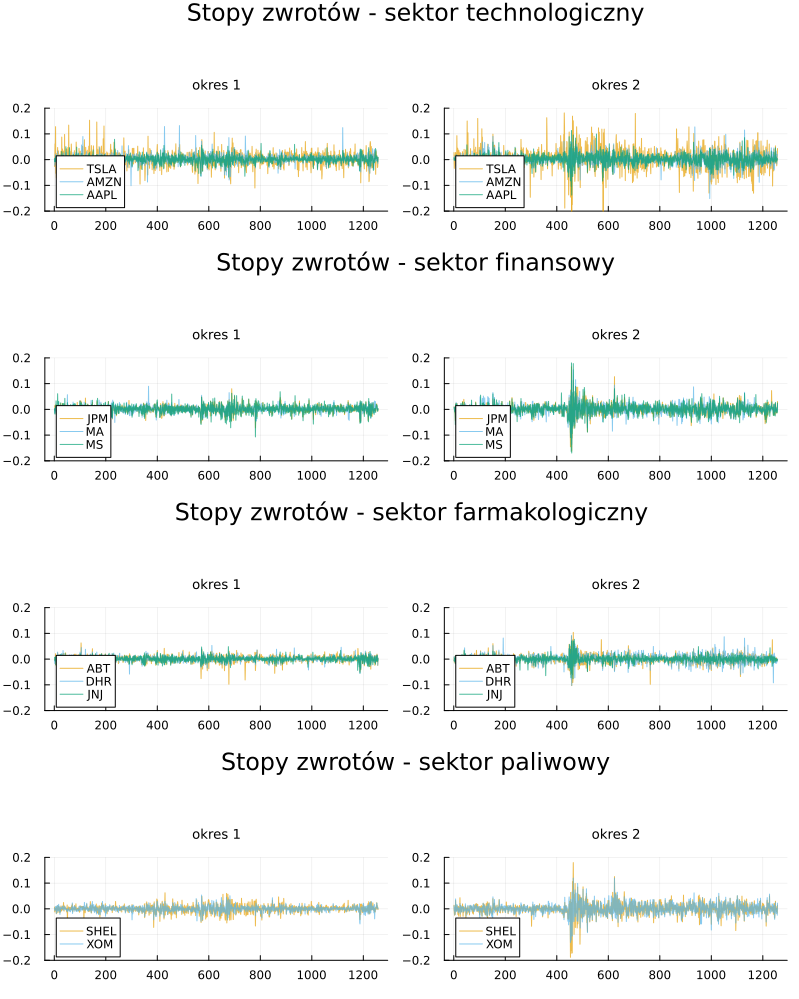

In [150]:
transpa = 0.7
p1 = plot(Matrix(rates_of_return_1[!,1:3]), labels = permutedims(names(rates_of_return_1)), 
    legend=:bottomleft, palette = ColorSchemes.okabe_ito, alpha = transpa, title = "okres 1")
p2 = plot(Matrix(rates_of_return_2[!,1:3]), labels = permutedims(names(rates_of_return_2)), 
    legend=:bottomleft, palette = ColorSchemes.okabe_ito, alpha = transpa, title = "okres 2")
p3 = plot(Matrix(rates_of_return_1[!,4:6]), labels = permutedims(names(rates_of_return_1[!,4:6])),
    legend=:bottomleft, palette = ColorSchemes.okabe_ito, alpha = transpa, title = "okres 1")
p4 = plot(Matrix(rates_of_return_2[!,4:6]), labels = permutedims(names(rates_of_return_2[!,4:6])),
    legend=:bottomleft, palette = ColorSchemes.okabe_ito, alpha = transpa, title = "okres 2")

p5 = plot(Matrix(rates_of_return_1[!,7:9]), labels = permutedims(names(rates_of_return_1[!,7:9])),
    legend=:bottomleft, palette = ColorSchemes.okabe_ito, alpha = transpa, title = "okres 1")
p6 = plot(Matrix(rates_of_return_2[!,7:9]), labels = permutedims(names(rates_of_return_2[!,7:9])),
    legend=:bottomleft, palette = ColorSchemes.okabe_ito, alpha = transpa, title = "okres 2")
p7 = plot(Matrix(rates_of_return_1[!,10:11]), labels = permutedims(names(rates_of_return_1[!,10:11])),
    legend=:bottomleft, palette = ColorSchemes.okabe_ito, alpha = transpa, title = "okres 1")
p8 = plot(Matrix(rates_of_return_2[!,10:11]), labels = permutedims(names(rates_of_return_2[!,10:11])),
    legend=:bottomleft, palette = ColorSchemes.okabe_ito, alpha = transpa, title = "okres 2")


d1 = plot(p1,p2, layout = 2, size=(800,300), plot_title = "Stopy zwrotów - sektor technologiczny", ylims = [-0.2, 0.2], titlefontsize = 9)
d2 = plot(p3,p4, layout = 2, size=(800,300), plot_title = "Stopy zwrotów - sektor finansowy", ylims = [-0.2, 0.2], titlefontsize = 9)
d3 = plot(p5,p6, layout = 2, size=(800,300), plot_title = "Stopy zwrotów - sektor farmakologiczny ", ylims = [-0.2, 0.2], titlefontsize = 9)
d4 = plot(p7,p8, layout = 2, size=(800,300), plot_title = "Stopy zwrotów - sektor paliwowy", ylims = [-0.2, 0.2], titlefontsize = 9)

plot(d1,d2,d3,d4, layout = (4,1), size = (800, 1000))

In [127]:
savefig("logzwroty_porownanie")

"c:\\Users\\shali\\Downloads\\logzwroty_porownanie.png"

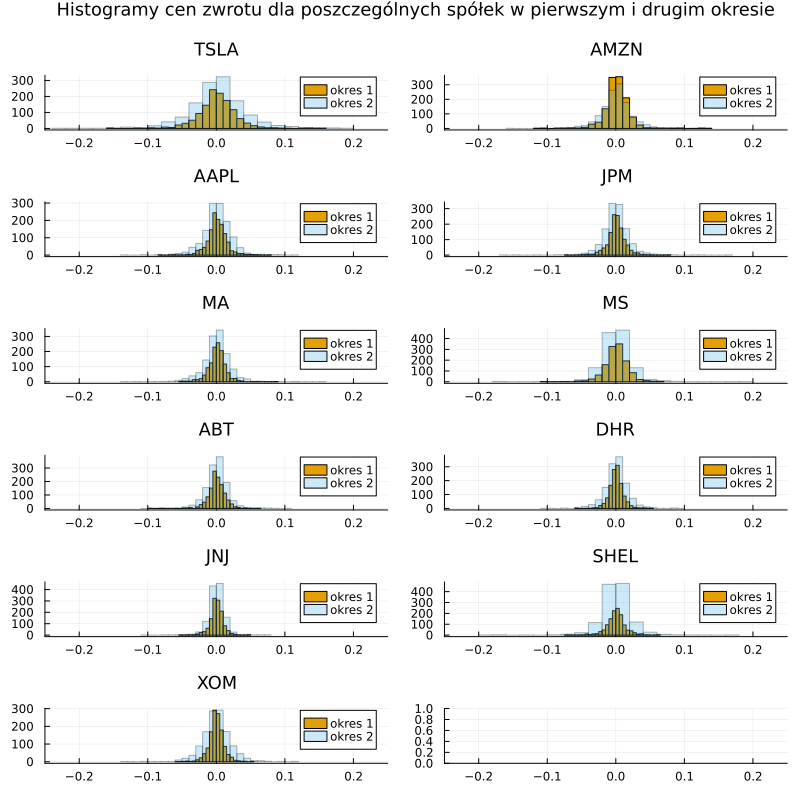

In [151]:
using StatsPlots

p1 = @df rates_of_return_1 histogram(cols(1:11); layout = (6, 2), bins = 30, xlims = [-0.25, 0.25], title = permutedims(names(rates_of_return_1)),
legend = false, size = (700, 1000), titlefontsize = 11, palette = ColorSchemes.okabe_ito, label ="okres 1")

p2 = @df rates_of_return_2 histogram!(cols(1:11); layout = (6, 2), bins = 30, xlims = [-0.25, 0.25], legend = :topright, title = permutedims(names(rates_of_return_2)),
size = (700, 1000), titlefontsize = 11, palette = ColorSchemes.okabe_ito, alpha = 0.3, label = "okres 2", color_legend = nothing)

plot(p2, size = (800,800), plot_title = "Histogramy cen zwrotu dla poszczególnych spółek w pierwszym i drugim okresie",
 titlefontsize = 12)

### Creating portfolio - periods comparision <a name="par7"></a>

In [129]:
r_mean_1 = Array(combine(rates_of_return_1, names(rates_of_return_1) .=> mean))
r_std_1 = Array(combine(rates_of_return_1, names(rates_of_return_1) .=> std))

1×11 Matrix{Float64}:
 0.0282634  0.0182879  0.0144777  …  0.00937783  0.01413  0.0112174

In [130]:
# 1szy Okres - ograniczenia warianacji
# ograniczenie wariancji pierwszego portfela 
var_max_1 = 0.5*(maximum(r_std_1)^2)
# ograniczenie wariancji drugiego portfela:
var_max2_1 = 0.25*(maximum(r_std_1)^2)
# ograniczenie wariancji trzeciego portfela:
var_max3_1 = 0.8*(maximum(r_std_1)^2)

println("α_1_1 = ", sqrt(var_max_1)) #ograniczenie ryzyka w postaci odchylenia standardowego
println("Przewidywana wariancja pierwszego portfela w pierwszym okresie", sqrt(var_max_1 * 252)) # wariancja dla całego roku
α₁¹ = sqrt(var_max_1)

println("α_2_1 = ", sqrt(var_max2_1)) 
println("Przewidywana wariancja drugiego portfela w pierwszym okresie ", sqrt(var_max2_1 * 252)) 
α₂¹ = sqrt(var_max2_1)

println("α_3_1 = ", sqrt(var_max3_1))
println("Przewidywana wariancja trzeciego portfela w pierwszym okresie ", sqrt(var_max3_1 * 252))
α₃¹ = sqrt(var_max3_1)

α_1_1 = 0.019985252424625705
Przewidywana wariancja pierwszego portfela w pierwszym okresie0.31725604682646147
α_2_1 = 0.014131707513177726
Przewidywana wariancja drugiego portfela w pierwszym okresie 0.22433390208342777
α_3_1 = 0.02527956691008792
Przewidywana wariancja trzeciego portfela w pierwszym okresie 0.40130068377306094


0.02527956691008792

In [131]:
r_mean_2 = Array(combine(rates_of_return_2, names(rates_of_return_2) .=> mean))
r_std_2 = Array(combine(rates_of_return_2, names(rates_of_return_2) .=> std))

1×11 Matrix{Float64}:
 0.0418702  0.0228425  0.0209905  …  0.0128921  0.0237359  0.0215487

In [132]:
#   2gi okres - ograniczenia wariancji
# ograniczenie wariancji pierwszego portfela 
var_max_2= 0.5*(maximum(r_std_2)^2)
# ograniczenie wariancji drugiego portfela:
var_max2_2 = 0.25*(maximum(r_std_2)^2)
# ograniczenie wariancji trzeciego portfela:
var_max3_2 = 0.8*(maximum(r_std_2)^2)

println("α_1_2 = ", sqrt(var_max_2)) #ograniczenie ryzyka w postaci odchylenia standardowego
println("Przewidywana wariancja pierwszego portfela w pierwszym okresie", sqrt(var_max_2 * 252)) # wariancja dla całego roku
α₁² = sqrt(var_max_2)

println("α_2_2 = ", sqrt(var_max2_2)) 
println("Przewidywana wariancja drugiego portfela w pierwszym okresie ", sqrt(var_max2_2 * 252)) 
α₂² = sqrt(var_max2_2)

println("α_3_2 = ", sqrt(var_max3_2))
println("Przewidywana wariancja trzeciego portfela w pierwszym okresie ", sqrt(var_max3_2 * 252))
α₃² = sqrt(var_max3_2)

α_1_2 = 0.029606698487589716
Przewidywana wariancja pierwszego portfela w pierwszym okresie0.4699917680390071
α_2_2 = 0.020935097269120188
Przewidywana wariancja drugiego portfela w pierwszym okresie 0.33233436628223684
α_3_2 = 0.03744984048745836
Przewidywana wariancja trzeciego portfela w pierwszym okresie 0.5944977874131164


0.03744984048745836

In [133]:
covar_1 = cov(Matrix(rates_of_return_1))
corr_1 = cor(Matrix(rates_of_return_1))
weights_1 = ones(size(stocks_1)[2])/size(stocks_1)[2];

In [134]:
covar_2 = cov(Matrix(rates_of_return_2))
corr_2 = cor(Matrix(rates_of_return_2))
weights_2 = ones(size(stocks_2)[2])/size(stocks_2)[2];

In [135]:
portfolio_mean_1(weights_1; r_mean = r_mean_1) =  sum(weights_1 .* r_mean_1')
portfolio_var_1(weights_1; covar = covar_1) = weights_1'*covar_1*weights_1

portfolio_var_1 (generic function with 1 method)

In [136]:
portfolio_mean_2(weights_2; r_mean = r_mean_2) =  sum(weights_2 .* r_mean_2')
portfolio_var_2(weights_2; covar = covar_2) = weights_2'*covar_2*weights_2

portfolio_var_2 (generic function with 1 method)

In [137]:
#optymalizacja z ograniczeniem wariancji - okres 1 
using JuMP, Ipopt
function optymalizacja1(rates_of_return=rates_of_return_1, var_max=var_max_1)
    portfolio = Model(Ipopt.Optimizer)
    set_silent(portfolio)
    @variable(portfolio, x[1:size(rates_of_return)[2]] >= 0)
    @objective(portfolio, Max, portfolio_mean_1(x))
    @constraint(portfolio, sum(x) == 1)
    @constraint(portfolio, portfolio_var_1(x) <= var_max);
    optimize!(portfolio)
    objective_value(portfolio)
    weights_opt = value.(x);
    return weights_opt
end

optymalizacja1 (generic function with 3 methods)

In [138]:
#optymalizacja z ograniczeniem wariancji - okres 2
using JuMP, Ipopt
function optymalizacja2(rates_of_return=rates_of_return_2, var_max=var_max_2)
    portfolio = Model(Ipopt.Optimizer)
    set_silent(portfolio)
    @variable(portfolio, x[1:size(rates_of_return)[2]] >= 0)
    @objective(portfolio, Max, portfolio_mean_2(x))
    @constraint(portfolio, sum(x) == 1)
    @constraint(portfolio, portfolio_var_2(x) <= var_max);
    optimize!(portfolio)
    objective_value(portfolio)
    weights_opt = value.(x);
    return weights_opt
end

optymalizacja2 (generic function with 3 methods)

In [139]:
#funkcja do optymalizacji portfela z podaniem wyników - okres 1 
function wynik_opt1(weights_opt=weights_opt)
    println(weights_opt)
    println("Suma wag: ",sum(weights_opt))
    stopa_zw = (1 + portfolio_mean_1(weights_opt)) ^ 252 - 1
    println("Stopa zwrotu: ", stopa_zw)
    odch = sqrt(portfolio_var_1(weights_opt)*252)
    println("Odch. stand. portfela: ",odch)
    return(stopa_zw, odch)
end

wynik_opt1 (generic function with 2 methods)

In [140]:
#funkcja do optymalizacji portfela z podaniem wyników - okres 2 
function wynik_opt2(weights_opt=weights_opt)
    println(weights_opt)
    println("Suma wag: ",sum(weights_opt))
    stopa_zw = (1 + portfolio_mean_2(weights_opt)) ^ 252 - 1
    println("Stopa zwrotu: ", stopa_zw)
    odch = sqrt(portfolio_var_2(weights_opt)*252)
    println("Odch. stand. portfela: ",odch)
    return(stopa_zw, odch)
end

wynik_opt2 (generic function with 2 methods)

In [141]:
# Wyniki dla pierwszego okresu
weights_opt_1 = optymalizacja1(rates_of_return_1, var_max_1)
println(wynik_opt1(weights_opt_1))
#res_s_1 , res_o_1 = wynik_opt(weights_opt_1)

weights_opt2_1 = optymalizacja1(rates_of_return_1, var_max2_1)
println(wynik_opt1(weights_opt2_1))
#res2_s_1, res2_o_1 = wynik_opt(weights_opt2_1)

weights_opt3_1= optymalizacja1(rates_of_return_1, var_max3_1)
println(wynik_opt1(weights_opt3_1))
#res3_s_1, res3_o_1 = wynik_opt(weights_opt3_1)

#data_table  = ["1" α₁ res_s res_o;"2" α₂ res2_s res2_o; "3" α₃ res3_s res3_o]

[4.2326521355167806e-6, 0.9999681934135017, 5.370057519930031e-6, 3.167440668810929e-6, 5.557235112810725e-6, 2.9486696226915647e-6, 2.255385346997961e-6, 2.677445652808054e-6, 2.108742785926951e-6, 1.9219742554747e-6, 1.5669833971901074e-6]
Suma wag: 1.0000000000000002
Stopa zwrotu: 0.4285015030944388
Odch. stand. portfela: 0.29030411145775004
(0.4285015030944388, 0.29030411145775004)
[6.4633450215904355e-6, 0.6377933094668471, 0.182666191163514, 7.424819922403263e-6, 0.17951006303484235, 3.900443638881633e-6, 2.5470145219393214e-6, 4.46155167820576e-6, 2.520568234960409e-6, 1.863644388406945e-6, 1.2549473900314018e-6]


Suma wag: 0.9999999999999999
Stopa zwrotu: 0.37025428748556855
Odch. stand. portfela: 0.2243392237867858
(0.37025428748556855, 0.2243392237867858)
[5.050965588520874e-6, 0.9999647905885374, 5.295539323057417e-6, 3.581895409664952e-6, 5.682085715668151e-6, 3.440050637871905e-6, 2.6206855014046674e-6, 3.0648225312629592e-6, 2.4345764705758112e-6, 2.2320123113834385e-6, 1.806777973100527e-6]
Suma wag: 1.0
Stopa zwrotu: 0.428500516476664
Odch. stand. portfela: 0.29030340731926657
(0.428500516476664, 0.29030340731926657)


In [142]:
# Wyniki dla drugiego okresu
weights_opt_2= optymalizacja2(rates_of_return_2, var_max_2)
println(wynik_opt2(weights_opt_2))
#res_s_2 , res_o_2 = wynik_opt(weights_opt_2)

weights_opt2_2 = optymalizacja2(rates_of_return_2, var_max2_2)
println(wynik_opt2(weights_opt2_2))
#res2_s_2, res2_o_2 = wynik_opt(weights_opt2_2)

weights_opt3_2= optymalizacja2(rates_of_return_2, var_max3_2)
println(wynik_opt2(weights_opt3_2))
#res3_s_2, res3_o_2 = wynik_opt(weights_opt3_2)

[0.582654209251632, 3.5611101648287045e-6, 0.4172855289792326, 4.566694228706135e-6, 7.474906540006653e-6, 5.747715169543253e-6, 8.525445136289432e-6, 1.425760752876541e-5, 6.195264473479674e-6, 3.1392835626966508e-6, 6.7937423312782895e-6]
Suma wag: 1.0000000000000002
Stopa zwrotu: 0.45519027963052006
Odch. stand. portfela: 0.46999344909876445
(0.45519027963052006, 0.46999344909876445)
[0.2235029877535932, 1.5995039059701244e-6, 0.6242571873433844, 3.075408918577905e-6, 4.984024036280428e-6, 3.4913238717576166e-6, 1.4774243803274557e-5, 0.1521718340600266, 2.2870885597978173e-5, 1.889740753095072e-6, 1.530571210891547e-5]
Suma wag: 1.0
Stopa zwrotu: 0.3431996518994791
Odch. stand. portfela: 0.332337908825541
(0.3431996518994791, 0.332337908825541)
[0.8582165539332534, 3.4047818097435276e-6, 0.14173351122434882, 4.0811746515302075e-6, 6.687124895731627e-6, 5.206453892467669e-6, 6.884224732862769e-6, 1.027229361413493e-5, 4.982238771578438e-6, 2.8604338058581616e-6, 5.55611622403128e-6]

### Results - periods comparison <a name="par8"></a>

In [143]:
initval_1 = sum(collect(stocks_1[end,:]) .* weights_opt_1)
initval_2 = sum(collect(stocks_2[end,:]) .* weights_opt_2)
initval2_1 = sum(collect(stocks_1[end,:]) .* weights_opt2_1)
initval2_2 = sum(collect(stocks_2[end,:]) .* weights_opt2_2)
initval3_1 = sum(collect(stocks_1[end,:]) .* weights_opt3_1)
initval3_2 = sum(collect(stocks_2[end,:]) .* weights_opt3_2)

println(initval_1)
println(initval_2)
println(initval2_1)
println(initval2_2)
println(initval3_1)
println(initval3_2)

79.36411728791973
173.37174428599394
92.43779991578964
180.94770464547483
79.36407414571231
173.69408407843412


In [144]:
endval_1 = run(10000, stocks_1, 252, weights_opt_1)
prc_rt_1 = (endval_1 .- initval_1)/initval_1*100
println(mean(prc_rt_1))
println(extrema(prc_rt_1))

endval_2 = run(10000, stocks_2, 252, weights_opt_2)
prc_rt_2 = (endval_2 .- initval_2)/initval_2*100
println(mean(prc_rt_2))
println(extrema(prc_rt_2))

endval2_1 = run(10000, stocks_1, 252, weights_opt2_1)
prc_rt2_1 = (endval2_1 .- initval2_1)/initval2_1*100
println(mean(prc_rt2_1))
println(extrema(prc_rt2_1))

endval2_2 = run(10000, stocks_2, 252, weights_opt2_2)
prc_rt2_2 = (endval2_2 .- initval2_2)/initval2_2*100
println(mean(prc_rt2_2))
println(extrema(prc_rt2_2))

endval3_1 = run(10000, stocks_1, 252, weights_opt3_1)
prc_rt3_1 = (endval3_1 .- initval3_1)/initval3_1*100
println(mean(prc_rt3_1))
println(extrema(prc_rt3_1))

endval3_2 = run(10000, stocks_2, 252, weights_opt3_2)
prc_rt3_2 = (endval3_2 .- initval3_2)/initval3_2*100
println(mean(prc_rt3_2))
println(extrema(prc_rt3_2))

22.442384186259797
(-51.483624379446944, 248.20187151313792)


23.660734423306554
(-59.500202606386765, 311.09156654432667)


22.518040905811148
(-41.86913509940701, 170.14220911129897)


23.932955494291587
(-69.5504138996005, 277.0785161248278)


22.479659032694805
(-59.618965828778315, 216.34475859109656)


23.98361669074619
(-72.81283689099092, 346.1569201848235)


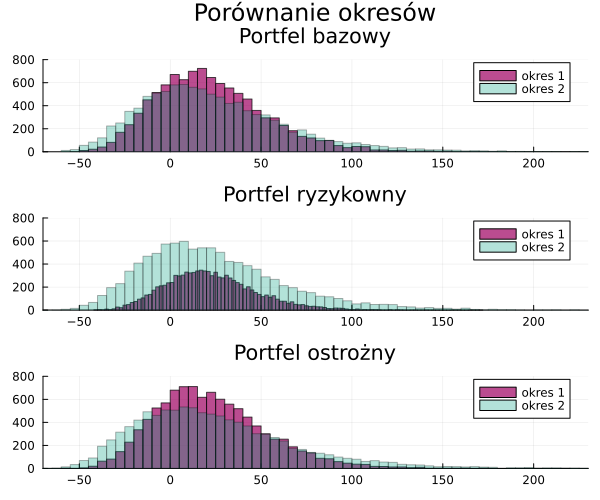

In [145]:
h1 = histogram(prc_rt_1, 
    legend = false, 
    alpha = 0.7,
    bins = 100,
    xlim = [-70,230],
    palette = ColorSchemes.mk_12,
    label = "okres 1")

h2 = histogram!(prc_rt_2, 
    legend = :topright, 
    alpha = 0.3,
    bins = 100,
    xlim = [-70,230],
    title = "Portfel bazowy", 
    label = "okres 2")

d1 = plot(h2, size = (800, 500))

h3 = histogram(prc_rt2_1, 
    legend = false, 
    alpha = 0.7,
    bins = 100,
    xlim = [-70,230],
    palette = ColorSchemes.mk_12,
    label = "okres 1")

h4 = histogram!(prc_rt2_2, 
    legend = :topright, 
    alpha = 0.3,
    bins = 100,
    xlim = [-70,230],
    title = "Portfel ryzykowny",
    label = "okres 2")

d2 = plot(h3, size = (800, 500))

h5 = histogram(prc_rt3_1, 
    legend = false,  
    alpha = 0.7,
    bins = 100,
    xlim = [-70,230],
    palette = ColorSchemes.mk_12,
    label = "okres 1")

h6 = histogram!(prc_rt3_2, 
    legend = :topright, 
    alpha = 0.3,
    bins = 100,
    xlim = [-70,230], 
    title = "Portfel ostrożny",
    label = "okres 2")

d3 = plot(h6, size = (800, 500))

plot(d1,d2,d3, layout = (3,1), size = (600,500), ylim = [0, 800], plot_title = "Porównanie okresów")

In [146]:
savefig("porownanie_symulacje")

"c:\\Users\\shali\\Downloads\\porownanie_symulacje.png"

In [147]:
using Statistics
# okres 1
println("Portfel bazowy - okres 1:")
println("VaR 1% = ", 1000*quantile!(prc_rt_1, 0.01))
var1_baz_1 = 1000*quantile!(prc_rt_1, 0.01)
println("VaR 10% = ", 1000*quantile!(prc_rt_1, 0.1))
var10_baz_1 = 1000*quantile!(prc_rt_1, 0.1)
println("Wartość oczekiwana: ", mean(prc_rt_1))
EX_baz_1 = mean(prc_rt_1)
println("Zakres: ", extrema(prc_rt_1))
println()

println("Portfel ostrożny - okres 1:")
println("VaR 1% = ", 1000*quantile!(prc_rt2_1, 0.01))
var1_ost_1 = 1000*quantile!(prc_rt2_1, 0.01)
println("VaR 10% = ", 1000*quantile!(prc_rt2_1, 0.1))
var10_ost_1 = 1000*quantile!(prc_rt2_1, 0.1)
println("Wartość oczekiwana: ", mean(prc_rt2_1))
EX_ost_1 = mean(prc_rt2_1)
println("Zakres: ", extrema(prc_rt2_1))
println()

println("Portfel ryzykowny - okres 1:")
println("VaR 1% = ", 1000*quantile!(prc_rt3_1, 0.01))
var1_ryz_1 = 1000*quantile!(prc_rt3_1, 0.01)
println("VaR 10% = ", 1000*quantile!(prc_rt3_1, 0.1))
var10_ryz_1 = 1000*quantile!(prc_rt3_1, 0.1)
println("Wartość oczekiwana: ", mean(prc_rt3_1))
EX_ryz_1 = mean(prc_rt3_1)
println("Zakres: ", extrema(prc_rt3_1))
println()
# okres 2
println("Portfel bazowy - okres 2:")
println("VaR 1% = ", 1000*quantile!(prc_rt_2, 0.01))
var1_baz_2 = 1000*quantile!(prc_rt_2, 0.01)
println("VaR 10% = ", 1000*quantile!(prc_rt_2, 0.1))
var10_baz_2 = 1000*quantile!(prc_rt_2, 0.1)
println("Wartość oczekiwana: ", mean(prc_rt_2))
EX_baz_2 = mean(prc_rt_2)
println("Zakres: ", extrema(prc_rt_2))
println()

println("Portfel ostrożny - okres 2:")
println("VaR 1% = ", 1000*quantile!(prc_rt2_2, 0.01))
var1_ost_2 = 1000*quantile!(prc_rt2_2, 0.01)
println("VaR 10% = ", 1000*quantile!(prc_rt2_2, 0.1))
var10_ost_2 = 1000*quantile!(prc_rt2_2, 0.1)
println("Wartość oczekiwana: ", mean(prc_rt2_2))
EX_ost_2 = mean(prc_rt2_2)
println("Zakres: ", extrema(prc_rt2_2))
println()

println("Portfel ryzykowny - okres 2:")
println("VaR 1% = ", 1000*quantile!(prc_rt3_2, 0.01))
var1_ryz_2 = 1000*quantile!(prc_rt3_1, 0.01)
println("VaR 10% = ", 1000*quantile!(prc_rt3_2, 0.1))
var10_ryz_2 = 1000*quantile!(prc_rt3_1, 0.1)
println("Wartość oczekiwana: ", mean(prc_rt3_2))
EX_ryz_2 = mean(prc_rt3_2)
println("Zakres: ", extrema(prc_rt3_2))


data_table3  = ["Portfel bazowy" "1" -var1_baz_1 -var10_baz_1 EX_baz_1;
"Portfel ostrożny" " " -var1_ost_1 -var10_ost_1 EX_ost_1;
"Portfel ryzykowny" " " -var1_ryz_1 -var10_ryz_1 EX_ryz_1;
"Portfel bazowy" "2" -var1_baz_2 -var10_baz_2 EX_baz_2; 
"Portfel ostrożny" " " -var1_ost_2 -var10_ost_2 EX_ost_2;
"Portfel ryzykowny" " " -var1_ryz_2 -var10_ryz_2 EX_ryz_2]


Portfel bazowy - okres 1:
VaR 1% = -32935.85478335315
VaR 10% = -13830.089435407284
Wartość oczekiwana: 22.442384186259797
Zakres: (-51.483624379446944, 248.20187151313792)

Portfel ostrożny - okres 1:
VaR 1% = -25023.296716406257
VaR 10% = -7461.153735786601
Wartość oczekiwana: 22.518040905811144
Zakres: (-41.86913509940701, 170.14220911129897)

Portfel ryzykowny - okres 1:
VaR 1% = -33695.61091642503
VaR 10% = -13609.395535688232
Wartość oczekiwana: 22.47965903269481
Zakres: (-59.618965828778315, 216.34475859109656)

Portfel bazowy - okres 2:
VaR 1% = -43896.62280147117
VaR 10% = -21531.155043454277
Wartość oczekiwana: 23.660734423306554
Zakres: (-59.500202606386765, 311.09156654432667)

Portfel ostrożny - okres 2:
VaR 1% = -41956.96184305902


VaR 10% = -20346.207698670754
Wartość oczekiwana: 23.932955494291587
Zakres: (-69.5504138996005, 277.0785161248278)

Portfel ryzykowny - okres 2:
VaR 1% = -46428.244384024285
VaR 10% = -24536.08873679831
Wartość oczekiwana: 23.98361669074619
Zakres: (-72.81283689099092, 346.1569201848235)


6×5 Matrix{Any}:
 "Portfel bazowy"     "1"  32935.9  13830.1   22.4424
 "Portfel ostrożny"   " "  25023.3   7461.15  22.518
 "Portfel ryzykowny"  " "  33695.6  13609.4   22.4797
 "Portfel bazowy"     "2"  43896.6  21531.2   23.6607
 "Portfel ostrożny"   " "  41957.0  20346.2   23.933
 "Portfel ryzykowny"  " "  33695.6  13609.4   23.9836

In [148]:
using PrettyTables
headers1 = (["Wariant portfela w wybranym okresie", "Okres","VaR 1%", "VaR 10%", "EX"])

pretty_table(data_table3,backend = Val(:latex), header = headers1,alignment = :c)

\begin{table}
  \begin{tabular}{ccccc}
    \hline\hline
    \textbf{Wariant portfela w wybranym okresie} & \textbf{Okres} & \textbf{VaR 1\%} & \textbf{VaR 10\%} & \textbf{EX} \\\hline
    Portfel bazowy & 1 & 32935.9 & 13830.1 & 22.4424 \\
    Portfel ostrożny &   & 25023.3 & 7461.15 & 22.518 \\
    Portfel ryzykowny &   & 33695.6 & 13609.4 & 22.4797 \\
    Portfel bazowy & 2 & 43896.6 & 21531.2 & 23.6607 \\
    Portfel ostrożny &   & 41957.0 & 20346.2 & 23.933 \\
    Portfel ryzykowny &   & 33695.6 & 13609.4 & 23.9836 \\\hline\hline
  \end{tabular}
\end{table}
